In [ ]:
# pip install odc-geo

In [1]:
import os
import json
import yaml
import math
import logging
import zarr
import s3fs
import fsspec
import numcodecs
import geojson
import pystac
import pyproj
import rioxarray
import pyarrow as pa
import pandas as pd
import geopandas as gpd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import shapely.geometry
import odc.geo.xr  # Habilita o accessor .odc.geo
import obstore as obs

from matplotlib.lines import Line2D
# from matplotlib.patches import Patch
from matplotlib.path import Path
from datetime import datetime
from IPython.display import HTML, display, Image
from copy import deepcopy
from tqdm.auto import tqdm

from odc.stac import configure_rio, stac_load
from odc.geo import CRS, Geometry, resxy_
from odc.geo.geobox import GeoBox
from shapely.geometry.base import BaseGeometry
from shapely.geometry import shape, Polygon, LinearRing, box, mapping
from shapely.ops import transform
from shapely import affinity, contains_xy
from rasterio import enums
# from rasterio.enums import Resampling
from rasterio.warp import Resampling
from rasterio.features import geometry_mask
from pystac_client import Client
from pystac.extensions.projection import ProjectionExtension
from geojson.utils import coords
from pyproj import Transformer  # CRS
from numcodecs import Blosc
from zarr.codecs.blosc import BloscCodec
from zarr.storage import ObjectStore
from obstore.store import S3Store, MemoryStore, from_url
from s3fs import S3Map

In [2]:
def bounds_to_ring(geom):
    minx, miny, maxx, maxy = geom.bounds
    return LinearRing([
        (minx, miny),
        (maxx, miny),
        (maxx, maxy),
        (minx, maxy),
        (minx, miny)
    ])


def load_geosjon(path: str) -> dict:
    with open(path, "r") as f:
        obj = geojson.load(f)
    return obj


def get_polygon_from_geometry(geometry: dict) -> Polygon:
    return Polygon(coords(geometry['coordinates']))


def square_from_centroid(poly: Polygon, r: float, mode: str = "circumscribed"):
    # 1) centróide
    c = poly.centroid
    cx, cy = c.x, c.y

    # 2) círculo (buffer) no centróide
    circ = c.buffer(r)

    # 3) tamanho do quadrado conforme o modo
    if mode == "circumscribed":
        side = 2 * r
    elif mode == "inscribed":
        side = math.sqrt(2) * r
    elif mode == "equal_area":
        side = math.sqrt(math.pi) * r
    else:
        raise ValueError("mode deve ser 'circumscribed', 'inscribed' ou 'equal_area'.")

    # Quadrado axis-aligned centrado no (cx, cy)
    half = side / 2.0
    quad = box(cx - half, cy - half, cx + half, cy + half)

    return quad, circ

## Carregando dados

In [3]:
gdf_municipios = gpd.read_file('data/municipio/BR_Municipios_2020.shp')

In [4]:
gdf_municipios.head(5)

,CD_MUN,NM_MUN,SIGLA_UF,AREA_KM2,geometry
0,1100015,Alta Floresta D'Oeste,RO,7067.127,"POLYGON ((-62.19465 -11.82746, -62.19332 -11.8..."
1,1100023,Ariquemes,RO,4426.571,"POLYGON ((-62.53648 -9.73222, -62.52765 -9.736..."
2,1100031,Cabixi,RO,1314.352,"POLYGON ((-60.37119 -13.36655, -60.37134 -13.3..."
3,1100049,Cacoal,RO,3793.000,"POLYGON ((-61.0008 -11.29737, -61.00103 -11.39..."
4,1100056,Cerejeiras,RO,2783.300,"POLYGON ((-61.49976 -13.00525, -61.49809 -13.0..."


In [5]:
crs = "EPSG:4674"
gdf_municipios = gdf_municipios.to_crs(crs)

In [6]:
gdf_mg = gdf_municipios[gdf_municipios['SIGLA_UF'] == 'MG']

In [7]:
gdf_mg['boundary'] = gdf_mg.boundary
gdf_mg["centroid"] = gdf_mg.centroid
gdf_mg["bounds"] = gdf_mg.geometry.apply(bounds_to_ring)

/home/sagemaker-user/.conda/envs/venv_geo/lib/python3.11/site-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipykernel_3461/553351102.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_mg["centroid"] = gdf_mg.centroid
/home/sagemaker-user/.conda/envs/venv_geo/lib/python3.11/site-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

In [8]:
# gdf_mg["bounds_buffer"] = gdf_mg["bounds_buffer"].buffer(0.05)

In [9]:
gdf = gdf_mg[gdf_mg['NM_MUN'] == 'Conselheiro Lafaiete'].reset_index()

In [10]:
gdf.head(5)

,index,CD_MUN,NM_MUN,SIGLA_UF,AREA_KM2,geometry,boundary,centroid,bounds
0,2445,3118304,Conselheiro Lafaiete,MG,370.246,"POLYGON ((-43.79878 -20.53897, -43.79853 -20.5...","LINESTRING (-43.79878 -20.53897, -43.79853 -20...",POINT (-43.78866 -20.66601),"LINEARRING (-43.93001 -20.80102, -43.67878 -20..."


In [11]:
geom = json.loads(gdf['geometry'].to_json())['features'][0]['geometry']
# geom

In [12]:
polygon = get_polygon_from_geometry(geom)

transformer = Transformer.from_crs("urn:ogc:def:crs:OGC:1.3:CRS84", "EPSG:4326", always_xy=True)
polygon = transform(transformer.transform, polygon)

In [13]:
# polygon = gdf.geometry[0]

In [14]:
min_lon, min_lat, max_lon, max_lat = polygon.bounds
print(f"Latitude:  {min_lat} : {max_lat}")
print(f"Longitude: {min_lon} : {max_lon}")

Latitude:  -20.801021996 : -20.538032996
Longitude: -43.930008 : -43.67878


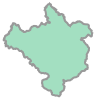

In [15]:
polygon

In [16]:
type(polygon)

shapely.geometry.polygon.Polygon

### Criando sub poligono da geometria selecionada

In [17]:
crs = "EPSG:4674"
crs = "epsg:3395" # load_stac
crs = "EPSG:32723"

In [18]:
r = 100
sub_quad, sub_circ = square_from_centroid(polygon, r, mode="circumscribed")

# transformer = Transformer.from_crs("urn:ogc:def:crs:OGC:1.3:CRS84", "EPSG:4326", always_xy=True)
# sub_quad = transform(transformer.transform, sub_quad)

In [19]:
min_lon, min_lat, max_lon, max_lat = sub_quad.bounds
print(f"Latitude:  {min_lat} : {max_lat}")
print(f"Longitude: {min_lon} : {max_lon}")

Latitude:  -120.66600844048679 : 79.33399155951321
Longitude: -143.7886567972554 : 56.21134320274458


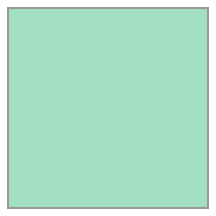

In [20]:
sub_quad

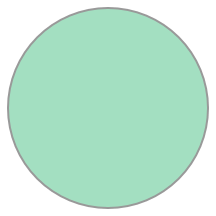

In [21]:
sub_circ

## Buscando imagens

In [22]:
CATALOG = "https://earth-search.aws.element84.com/v1/"
client = Client.open(CATALOG)

In [23]:
start_date = datetime(2025, 3, 1).strftime("%Y-%m-%d")
end_date = datetime(2025, 3, 30).strftime("%Y-%m-%d")

search = client.search(
    collections=["sentinel-2-l2a"],
    datetime=f"{start_date}/{end_date}",
    bbox=polygon.bounds,
    sortby=[{"field": "properties.datetime", "direction": "desc"}],
)

items = list(search.items())
print(f"Found: {len(items):d} datasets")

Found: 24 datasets


In [ ]:
collections = search.item_collection()
collections

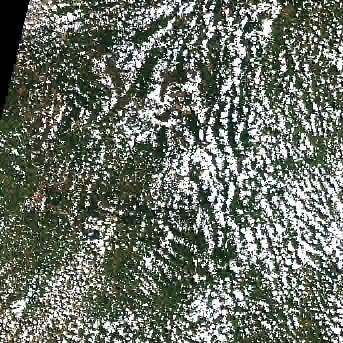

In [25]:
Image(collections[1].assets['thumbnail'].href)

In [26]:
crs = items[0].properties['proj:code']
crs

'EPSG:32723'

In [48]:
# def geobox_padrao(
#     aoi: BaseGeometry | dict,
#     src_crs: str,
#     crs_alvo: str = "EPSG:32723",
#     res_m: int = 10,
#     margem_m: float = 0.0,
# ):
#     # 1) Normaliza o AOI para GeoJSON
#     if isinstance(aoi, BaseGeometry):      # shapely geometry
#         aoi_geojson = mapping(aoi)
#     elif isinstance(aoi, dict):            # GeoJSON já
#         aoi_geojson = aoi
#     else:
#         raise TypeError("aoi deve ser shapely geometry ou GeoJSON dict")

#     # 2) Cria Geometry no CRS de origem e reprojeta para o CRS alvo
#     g = Geometry(aoi_geojson, CRS(src_crs)).to_crs(CRS(crs_alvo))
#     if margem_m:
#         g = g.buffer(margem_m)

#     # 3) Define resolução (y negativo = origem no topo, padrão de raster)
#     res = resxy_(res_m, -res_m)

#     # 4) Constrói um GeoBox estável (CRS+res+origem/alinhamento+extensão)
#     gb = GeoBox.from_geopolygon(g, resolution=res, tight=True) # anchor=(0, 0), 
#     return gb


# gb = geobox_padrao(polygon, src_crs=crs)

# constants = ["red", "green", "blue", "nir", "nir08", "rededge1", "rededge2", "rededge3", "swir16", "swir22"]
# categorical = ["scl"]

# dataset = stac_load(
#     items,
#     bands=(constants + categorical),
#     geobox=gb,
#     # groupby="solar_day",
#     # nodata=0,
#     chunks={"x": 2048, "y": 2048, "time": 1},  # <-- use Dask
#     resampling={**{n: "bilinear" for n in constants}, **{n: "nearest" for n in categorical}},
# )

In [49]:
%%time
# https://odc-stac.readthedocs.io/en/latest/_api/odc.stac.load.html
# crs = "epsg:3395" # EPSG:32723 | 4326 | 3857 | 3395 | 4674 | ESRI:54009

constants = ["red", "green", "blue", "nir", "nir08", "rededge1", "rededge2", "rededge3", "swir16", "swir22"]
categorical = ["scl"]

dataset = stac_load(
    items,
    bands=(constants + categorical),
    crs="utm",
    resolution=10,
    groupby="solar_day",
    bbox=polygon.bounds,
    # dtype="uint16", # nao especificando esta trazendo scl como uint8. Isso e bom
    nodata=0,
    # query={"eo:cloud_cover": {"lt": 20}},
    progress=tqdm,
    chunks={"x": 2048, "y": 2048, "time": 1},  # <-- use Dask
    # pool=4,
    resampling={**{n: "bilinear" for n in constants}, **{n: "nearest" for n in categorical}},
)

# tempo sem dask: 36.5 s
# tempo com dask: 200 ms

CPU times: user 191 ms, sys: 0 ns, total: 191 ms
Wall time: 190 ms


In [50]:
# https://docs.xarray.dev/en/latest/api/dataset.html
dataset

<xarray.Dataset> Size: 2GB
Dimensions:      (y: 2931, x: 2640, time: 12)
Coordinates:
  * y            (y) float64 23kB 7.729e+06 7.729e+06 ... 7.699e+06 7.699e+06
  * x            (x) float64 21kB 6.114e+05 6.114e+05 ... 6.377e+05 6.377e+05
    spatial_ref  int32 4B 32723
  * time         (time) datetime64[ns] 96B 2025-03-01T13:18:12.480000 ... 202...
Data variables:
    red          (time, y, x) uint16 186MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    green        (time, y, x) uint16 186MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    blue         (time, y, x) uint16 186MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    nir          (time, y, x) uint16 186MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    nir08        (time, y, x) uint16 186MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    rededge1     (time, y, x) uint16 186MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    rededge2     (time, y, x) uint16 186MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    rededge3     (time, y, x) uint16 186MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    swir16       (time, y, x) uint16 186MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    swir22       (time, y, x) uint16 186MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    scl          (time, y, x) uint8 93MB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>

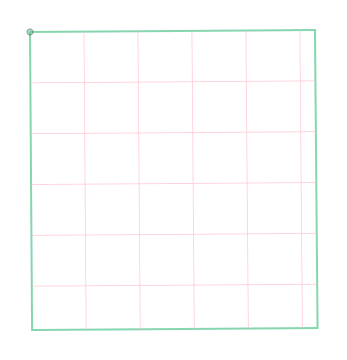

In [51]:
dataset.odc.geobox

In [52]:
dataset.rio.crs

CRS.from_wkt('PROJCS["WGS 84 / UTM zone 23S",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-45],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",10000000],UNIT["metre",1],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32723"]]')

In [53]:
type(dataset)

xarray.core.dataset.Dataset

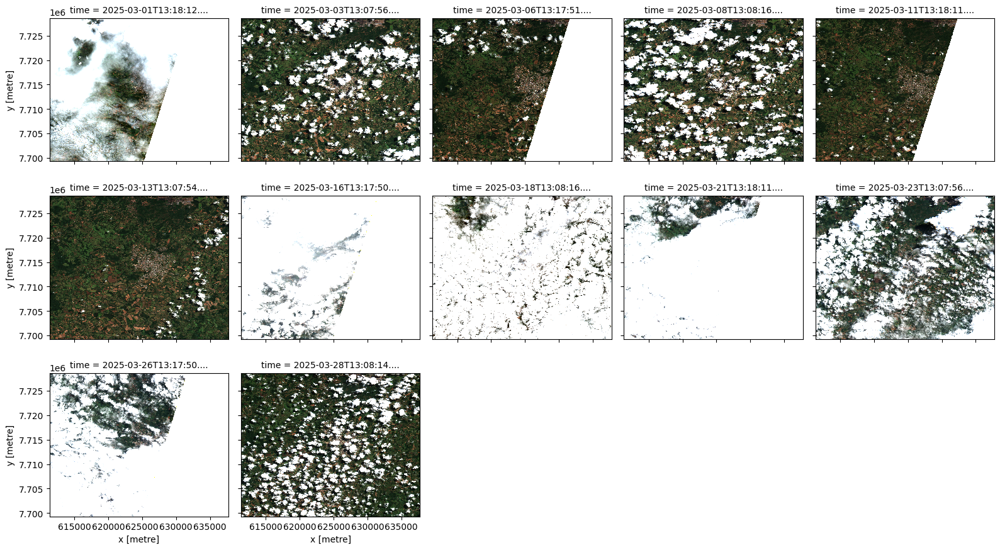

In [54]:
vis = dataset.odc.to_rgba(bands=("red", "green", "blue"), vmin=0, vmax=3400)
vis.plot.imshow(col='time', rgb='band', col_wrap=5, robust=True)
plt.show()

In [ ]:
_ = (
    dataset
    .drop_vars("scl", errors="ignore")
    .isel(time=5)
    .to_array("band")
    .plot.imshow(
        col="band",
        col_wrap=5,
        size=5,
        vmin=0,
        vmax=3400,
    )
)

### Reprojection CRS

In [ ]:
# Reprojetar para coordenadas geográficas
ds_reproj = dataset.odc.reproject(
    how="EPSG:4326",
    resolution=10,  #"fit",  # Determina automaticamente resolução apropriada
    resampling="bilinear",
    dst_nodata=0
)


In [ ]:
ds_reproj.rio.crs

In [ ]:
ds_reproj

In [ ]:
# ds2 = dataset.rio.write_crs("EPSG:32723")
# ds2 = dataset.rio.write_crs(dataset.rio.crs, inplace=True)
# ds_reproj = ds2.rio.reproject("EPSG:3395", resampling=enums.Resampling.bilinear)

In [ ]:
# latitude: y
# longitude: x

print(f"latitude(y)  : {ds_reproj.latitude.values.min()} : {ds_reproj.latitude.values.max()}")
print(f"longitude (x): {ds_reproj.longitude.values.min()} : {ds_reproj.longitude.values.max()}")

In [ ]:
min_x, min_y, max_x, max_y = sub_quad.bounds
print(f"Y:  {min_y} : {max_y}")
print(f"X: {min_x} : {max_x}")

In [ ]:
# ds_reproj.sel(x=slice(min_x, max_x), y=slice(min_y, max_y))

# Armazenamento no S3

In [ ]:
S3_BUCKET = "data-us-east-1-891377318910"
S3_PREFIX = "geospatial/workshop/zarr"

## Write

In [ ]:
compressor = BloscCodec(cname="lz4", clevel=5, shuffle="shuffle")

In [ ]:
encoding = {
    var: {
        "compressor": compressor,
        "shards": (1, 4096, 4096),
        "chunks": (1, 2048, 2048),  # (time, y, x),
    }
    for var in dataset.data_vars
}

In [ ]:
s3_store = S3Store(bucket=S3_BUCKET, prefix=f"{S3_PREFIX}/lafaiete.zarr")
zarr_store = ObjectStore(s3_store)

In [ ]:
%%time
# https://github.com/maxrjones/zarr-obstore-performance/tree/main

dataset.to_zarr(
    store=zarr_store,
    mode="w",
    consolidated=True,  # consolidates metadata into a single .zmetadata
    encoding=encoding,
    write_empty_chunks=False,
    zarr_format=3,
    # align_chunks=True,
)

# tempo: 2 min 16 seg -> 12 dias com 11 bandas (11 seg por dia)
# tempo: 2 min 57 seg -> 22 dias com 11 bandas (9 seg por dia)

In [ ]:
# del(dataset)

## Read

In [ ]:
s3_store = S3Store(bucket=S3_BUCKET, prefix=f"{S3_PREFIX}/lafaiete.zarr", region="us-east-1", skip_signature=False)
zarr_store = ObjectStore(s3_store, read_only=True)

In [ ]:
%%time

ds = xr.open_zarr(
    store=zarr_store,
    consolidated=True,       # usa o .zmetadata consolidado
    chunks={"time": 1},      # opcional: força chunking no tempo para streaming diário
)

# tempo: 325 ms

In [ ]:
ds

In [ ]:
# vis = ds.odc.to_rgba(bands=("red", "green", "blue"), vmin=0, vmax=3400)
# vis.plot.imshow(col='time', rgb='band', col_wrap=5, robust=True)

# Manipulacao de dados com Xarray

In [ ]:
ds

In [ ]:
ds['x'] # 2798 pixels

In [ ]:
ds['x'].values

In [ ]:
ds['x'].min()

In [ ]:
ds['scl']

In [ ]:
ds.scl

In [ ]:
ds['scl'].values

In [ ]:
ds['scl'].values.max()

In [ ]:
ds['scl'].values.min()

In [ ]:
ds['scl'].values.astype(float)

In [ ]:
ds.dims

In [ ]:
ds.dims.get("y")
ds.dims.get("x")
ds.dims.get("time")

In [ ]:
ds.time.size

In [ ]:
ds.time.values

## Selecao

In [ ]:
ds.isel(time=10).to_array("band")

In [ ]:
ds2 = ds.sel(time=slice('2025-03-06', '2025-03-16'))

In [ ]:
ds2

In [ ]:
ds.sel(time='2025-03-06')

In [ ]:
ds.time.values

In [ ]:
ds.isel(time=3)

In [ ]:
ds.isel(time=slice(0, 3))

## Filtragem

In [ ]:
ds2 = ds["blue"].where(ds["scl"] > 5)
ds2

In [ ]:
type(ds2)

In [ ]:
ds2.values

In [ ]:
ds3 = ds2.fillna(-999)
ds3

In [ ]:
ds3.values

In [ ]:
ds2 = ds["blue"].where(ds["scl"] > 5, other=0)
ds2.values

In [ ]:
dataset.odc.geobox.transform

In [ ]:
dataset.odc.geobox.height

In [ ]:
polygon_mask = geometry_mask(
    [sub_quad],
    transform=dataset.odc.geobox.transform,
    invert=True,
    out_shape=(dataset.odc.geobox.height, dataset.odc.geobox.width)
)

In [ ]:
ds_masked = ds.where(polygon_mask)
# ds_masked = ds_masked.fillna(0)
# ds_masked = ds_masked.where(np.isfinite(ds_masked), 0)

## Agrupamentos

In [ ]:
monthly_mean = ds.groupby("time.month").mean(dim="time")

In [ ]:
ndvi = (dataset.nir - dataset.red) / (dataset.nir + dataset.red)
ndwi = (dataset.green - dataset.nir) / (dataset.green + dataset.nir)